# Project
This challenge aims to use Generative Adversarial Networks (GANs) to generate images in the style of Claude Monet. Participants are required to train a model to produce 7,000 to 10,000 images that closely resemble real Monet paintings in style. A GAN consists of two neural networks: a generator that creates images and a discriminator that determines whether the images are real or fake. Through adversarial training, both networks improve, resulting in increasingly realistic generated images.

This task is unsupervised, requiring no class labels, and focuses on learning artistic style transfer. The dataset contains thousands of Monet paintings, each in JPEG format, with a resolution of 256×256 pixels and RGB color channels. These images are used to train the model to replicate Monet's colors and brushstroke patterns. The ultimate goal is to produce high-quality, art-style images that can fool the discriminator.

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

input_path = "/kaggle/input"
folders = [name for name in os.listdir(input_path) if os.path.isdir(os.path.join(input_path, name))]

for folder in folders:
    folder_path = os.path.join(input_path, folder)
    print(f"\n {folder}/")
    for item in os.listdir(folder_path):
        print(f"  - {item}")

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session


 gan-getting-started/
  - monet_jpg
  - photo_tfrec
  - photo_jpg
  - monet_tfrec


In [3]:
import os
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from tensorflow.keras.metrics import AUC
from keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, LeakyReLU, BatchNormalization, Conv2DTranspose, Conv2D, MaxPooling2D, Dropout 

# Data Inspection

This dataset is designed for training a GAN model to generate Monet-style images and consists of four main folders:

1. photo_jpg:

   Contains 7,038 real-world photos in JPEG format, serving as source images for style transfer.

3. monet_jpg:

   Contains 300 Monet-style paintings in JPEG format, representing the target style.

5. photo_tfrec:

   Includes 20 TFRecord files, totaling approximately 7,038 images. These are optimized for efficient model training.

7. monet_tfrec:

   Includes 5 TFRecord files, each containing around 60 images, totaling 300 images — matching the count in monet_jpg.

The images are assumed to be 256×256 pixels with RGB channels. The task involves unpaired image-to-image translation, meaning that the Monet paintings and real photos do not need to be directly matched. Notably, the number of Monet-style images is much smaller than the number of real photos, so data augmentation may be useful during training.

The TFRecord format allows faster data loading and improved memory efficiency, making it suitable for large-scale training. This dataset structure is ideal for training models such as CycleGAN, which do not require paired image data.

In [4]:
data_dir = '/kaggle/input/gan-getting-started'

for folder in os.listdir(data_dir):
    folder_path = os.path.join(data_dir, folder)
    if os.path.isdir(folder_path):
        num_files = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
        print(f"{folder}: {num_files} files")

monet_jpg: 300 files
photo_tfrec: 20 files
photo_jpg: 7038 files
monet_tfrec: 5 files


In [5]:
folders_to_check = ['photo_tfrec', 'monet_tfrec']

for folder_name in folders_to_check:
    folder_path = os.path.join(data_dir, folder_name)
    if os.path.isdir(folder_path):
        print(f"Files in '{folder_name}' folder:")
        # 列出該資料夾內的所有文件
        files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
        for file in files:
            print(file)
        print(f"Total files: {len(files)}\n")
    else:
        print(f"Folder '{folder_name}' does not exist.")

Files in 'photo_tfrec' folder:
photo12-352.tfrec
photo11-352.tfrec
photo05-352.tfrec
photo08-352.tfrec
photo18-352.tfrec
photo06-352.tfrec
photo17-352.tfrec
photo10-352.tfrec
photo09-352.tfrec
photo15-352.tfrec
photo04-352.tfrec
photo19-350.tfrec
photo02-352.tfrec
photo16-352.tfrec
photo03-352.tfrec
photo00-352.tfrec
photo01-352.tfrec
photo14-352.tfrec
photo07-352.tfrec
photo13-352.tfrec
Total files: 20

Files in 'monet_tfrec' folder:
monet12-60.tfrec
monet16-60.tfrec
monet08-60.tfrec
monet04-60.tfrec
monet00-60.tfrec
Total files: 5



# EDA
This project first checks the two main folders in the dataset: "photo_jpg" contains 7,038 real photos, and "monet_jpg" contains 300 Monet-style paintings. The images are displayed using matplotlib and PIL functions to ensure they are all RGB three-channel, 256x256 resolution JPEG images, suitable for subsequent training.

Next, using the function compare_image_colors_normalized(), a sample of up to 500 images is taken to perform histogram analysis of the average pixel values in the RGB color channels. The results show:

Red channel: Monet images are more skewed toward brighter hues, while photos are more concentrated in the middle range of colors.

Green channel: There is a clear difference between the two. Monet images tend to have a lighter green, while photos are generally darker.

Blue channel: Monet images use blue more extensively, resulting in a cooler overall tone.

These differences reflect the stylistic features of Monet's paintings—soft, bright, and cool colors—which differ from the actual color representation of modern photographic images.

In [6]:
def show_img(path, title=None):
    files = [os.path.join(path, f) for f in os.listdir(path) if f.endswith('.jpg')]
    sample_files = files[:3]
    
    if not sample_files:
        print(f"No JPG files found in {path}")
        return

    fig, axs = plt.subplots(1, len(sample_files), figsize=(15, 5))
    if len(sample_files) == 1:
        axs = [axs]

    for i, file_path in enumerate(sample_files):
        img = Image.open(file_path)
        axs[i].imshow(img)
        axs[i].axis('off')
        axs[i].set_title(os.path.basename(file_path))
    
    if title:
        plt.suptitle(title, fontsize=16)
    plt.show()

def convert_RGB(img_dir):
    path = img_dir  
    img = cv2.imread(path)
    if img is None:
        raise FileNotFoundError(f"Image not found at {path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def compare_image_colors_normalized(path1, path2, max_images=500):
    """
    Compares normalized average RGB values for the first `max_images` in two folders using OpenCV.
    """

    def get_avg_colors(image_folder):
        files = [os.path.join(image_folder, f) for f in os.listdir(image_folder)
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        avg_colors = []

        for file in sorted(files)[:max_images]:
            try:
                img = convert_RGB(file)
                mean_color = img.mean(axis=(0, 1))  # average RGB 
                avg_colors.append(mean_color)
            except Exception as e:
                print(f"Error reading {file}: {e}")
                continue
        return np.array(avg_colors)

    avg_colors1 = get_avg_colors(path1)
    avg_colors2 = get_avg_colors(path2)

    fig, axes = plt.subplots(3, 1, figsize=(8, 10), sharex=True)
    color_labels = ['Red', 'Green', 'Blue']
    dark_shades = ['darkred', 'darkgreen', 'darkblue']
    pastel_shades = ['salmon', 'lightgreen', 'lightblue']

    for i in range(3):
        axes[i].hist(avg_colors1[:, i], bins=30, alpha=0.7, label='Photo', color=dark_shades[i], density=True)
        axes[i].hist(avg_colors2[:, i], bins=30, alpha=0.7, label='Monet', color=pastel_shades[i], density=True, linestyle='dashed')
        axes[i].set_title(f'Normalized Comparison of {color_labels[i]} Channel')
        axes[i].legend(loc='upper right')

    plt.tight_layout()
    plt.show()

def load_dataset(folder_path, label, image_size=(256, 256)):
    images = []
    labels = []
    for file in os.listdir(folder_path):
        if file.endswith('.jpg') or file.endswith('.png'):
            try:
                
                img = cv2.imread(os.path.join(folder_path, file))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
                img = cv2.resize(img, image_size)  
                img = img / 255.0  
                images.append(img)
                labels.append(label)
            except Exception as e:
                print(f"Error loading image {file}: {e}")
    return np.array(images), np.array(labels)

def graph_train_hist(gen_g_losses, gen_f_losses, disc_x_losses, disc_y_losses):
    # Plot losses for CycleGAN training
    plt.figure(figsize=(12, 10))

    # Plot Generator G Loss
    plt.subplot(2, 2, 1)
    plt.plot(gen_g_losses, label="Generator G Loss")
    plt.title("Generator G Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()

    # Plot Generator F Loss
    plt.subplot(2, 2, 2)
    plt.plot(gen_f_losses, label="Generator F Loss")
    plt.title("Generator F Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()

    # Plot Discriminator X Loss
    plt.subplot(2, 2, 3)
    plt.plot(disc_x_losses, label="Discriminator X Loss")
    plt.title("Discriminator X Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()

    # Plot Discriminator Y Loss
    plt.subplot(2, 2, 4)
    plt.plot(disc_y_losses, label="Discriminator Y Loss")
    plt.title("Discriminator Y Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [7]:
photo_path=os.path.join(data_dir,'photo_jpg')
photo_files=os.listdir(photo_path)
photo_files[:5]
photo_0 = mpimg.imread(os.path.join(photo_path, photo_files[0]))
photo_0.shape
print("photo_0 shape:", photo_0.shape)


monet_path=os.path.join(data_dir,'monet_jpg')
monet_files=os.listdir(monet_path)
monet_files[:5]
monet_0 = mpimg.imread(os.path.join(monet_path, monet_files[0]))
monet_0.shape
print("monet_0 shape:", monet_0.shape)

photo_0 shape: (256, 256, 3)
monet_0 shape: (256, 256, 3)


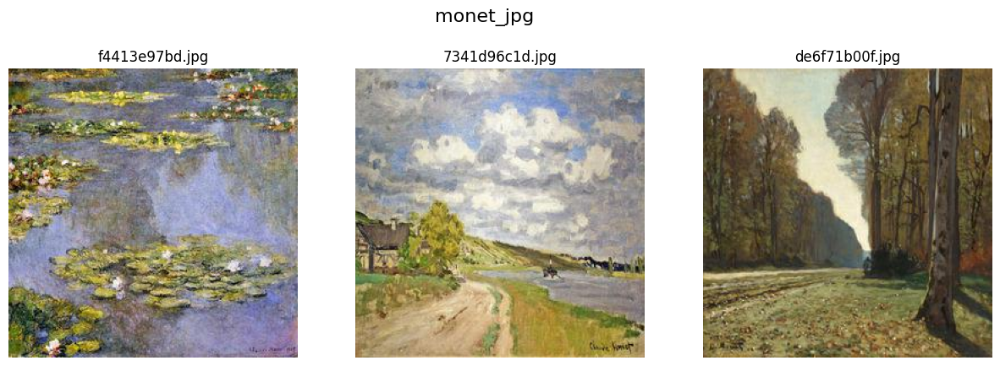

In [8]:
show_img(os.path.join(data_dir, 'monet_jpg'), title='monet_jpg')

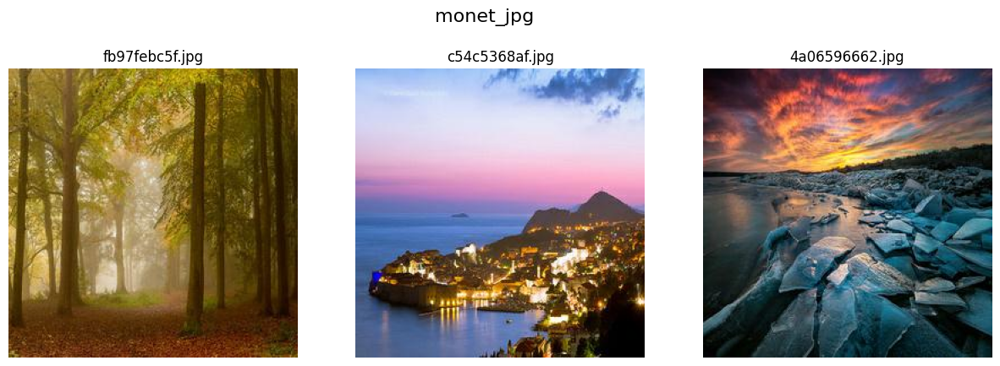

In [9]:
show_img(os.path.join(data_dir, 'photo_jpg'), title='monet_jpg')

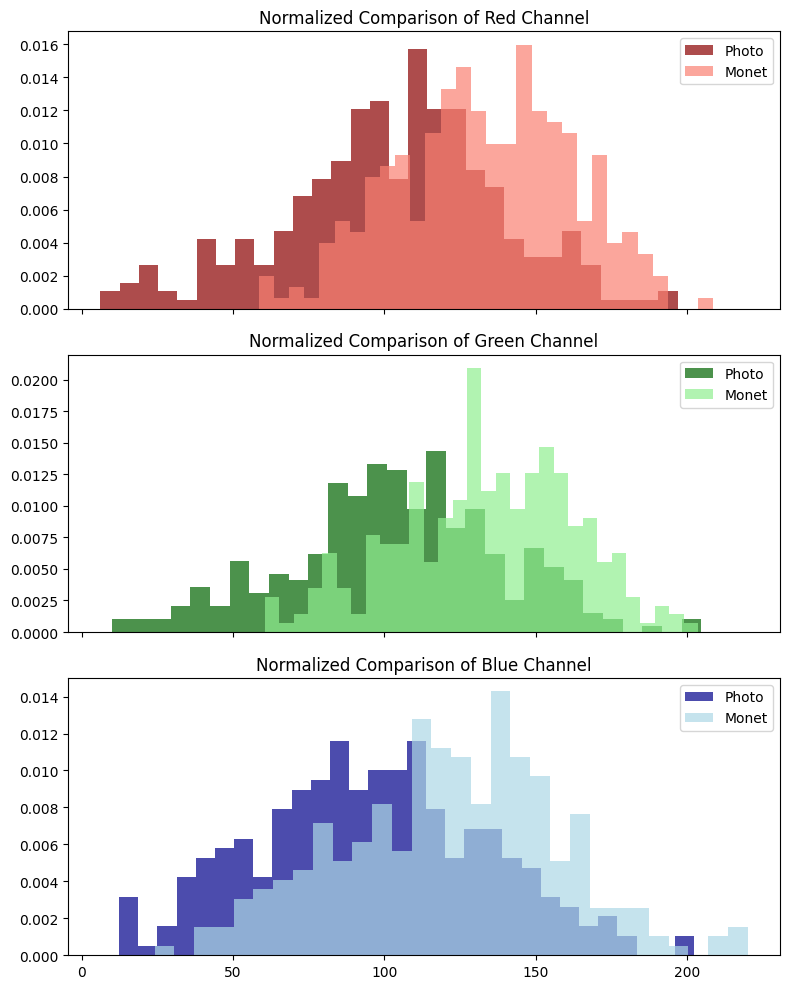

In [10]:
compare_image_colors_normalized(photo_path, monet_path, max_images=300)


# Data Conversion
The program reads all JPEG images from the specified folder and converts them into TFRecord format for TensorFlow use. First, the program lists all .jpg files in the folder, then reads, decodes, resizes each image to 256x256, and ensures its pixel type is uint8. Next, each image is converted into a JPEG binary file, and these image data are wrapped into TFRecord format as tf.train.Example. Finally, these examples are written to the specified .tfrecord file. The program calls the create_tfrecord_from_folder function to generate corresponding TFRecord files (monet_data.tfrecord and photo_data.tfrecord) for the "monet_path" and "photo_path" folders. The processed data can be efficiently used for subsequent machine learning training.

In [11]:
import tensorflow as tf
import os

def create_tfrecord_from_folder(image_folder, tfrecord_filename):
    # Get all .jpg files from the folder
    image_paths = [os.path.join(image_folder, fname) for fname in os.listdir(image_folder) if fname.endswith('.jpg')]

    with tf.io.TFRecordWriter(tfrecord_filename) as writer:
        for image_path in image_paths:
            # Read and decode the image
            image = tf.io.read_file(image_path)
            image = tf.image.decode_jpeg(image, channels=3)
            image = tf.image.resize(image, [256, 256])
            image = tf.cast(image, tf.uint8)  # Ensure image remains in uint8 format for JPEG encoding

            # Encode the image as JPEG bytes
            image_bytes = tf.io.encode_jpeg(image).numpy()

            # Create the TFRecord feature for the image
            feature = {
                'image': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_bytes])),
            }

            # Create a tf.train.Example and write it to the file
            example = tf.train.Example(features=tf.train.Features(feature=feature))
            writer.write(example.SerializeToString())


In [11]:
create_tfrecord_from_folder(monet_path, tfrecord_filename='monet_data.tfrecord')
create_tfrecord_from_folder(photo_path, tfrecord_filename='photo_data.tfrecord')

In [7]:
import glob
import time

class CycleGAN:
    def __init__(self, photo_path_pattern, monet_path_pattern, 
                 img_height=256, img_width=256, batch_size=1, buffer_size=1000,
                 epochs=50, lambda_cycle=10):
        # Basic parameter settings
        self.IMG_HEIGHT = img_height
        self.IMG_WIDTH = img_width
        self.BATCH_SIZE = batch_size
        self.BUFFER_SIZE = buffer_size
        self.EPOCHS = epochs
        self.LAMBDA = lambda_cycle
        
        # Construct the dataset
        self.photo_paths = glob.glob(photo_path_pattern)
        self.monet_paths = glob.glob(monet_path_pattern)
        self.dataset_x = self.create_dataset(self.photo_paths)
        self.dataset_y = self.create_dataset(self.monet_paths)
        
        # Build models
        self.generator_g = self.build_generator()  # Photo -> Monet
        self.generator_f = self.build_generator()  # Monet -> Photo
        self.discriminator_x = self.build_discriminator()  # Domain X (Photos)
        self.discriminator_y = self.build_discriminator()  # Domain Y (Monet)
        
        # Define loss function
        self.loss_obj = tf.keras.losses.MeanSquaredError()
        
        # Load and preprocess image
        self.generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        self.generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        self.discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        self.discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    # Load and preprocess image
    def load_image(self, image_file):
        image = tf.io.read_file(image_file)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [self.IMG_HEIGHT, self.IMG_WIDTH])
        image = (image / 127.5) - 1  # 將像素歸一化到 [-1,1]
        return image

    # Create dataset from image paths
    def create_dataset(self, paths):
        dataset = tf.data.Dataset.from_tensor_slices(paths)
        dataset = dataset.map(self.load_image, num_parallel_calls=tf.data.AUTOTUNE)
        dataset = dataset.shuffle(self.BUFFER_SIZE).batch(self.BATCH_SIZE)
        return dataset

    # Residual block for the generator
    def resnet_block(self, x, filters, size=3):
        initializer = tf.random_normal_initializer(0., 0.02)
        y = tf.keras.layers.Conv2D(filters, size, strides=1, padding='same',
                                   kernel_initializer=initializer, use_bias=False)(x)
        y = BatchNormalization()(y)
        y = tf.keras.layers.ReLU()(y)
        y = tf.keras.layers.Conv2D(filters, size, strides=1, padding='same',
                                   kernel_initializer=initializer, use_bias=False)(y)
        y = BatchNormalization()(y)
        return tf.keras.layers.add([x, y])

    # Build the generator model
    def build_generator(self):
        initializer = tf.random_normal_initializer(0., 0.02)
        inputs = tf.keras.layers.Input(shape=[self.IMG_HEIGHT, self.IMG_WIDTH, 3])

        # Downsampling
        x = tf.keras.layers.Conv2D(64, 7, strides=1, padding='same',kernel_initializer=initializer, use_bias=False)(inputs)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ReLU()(x)

        x = tf.keras.layers.Conv2D(128, 3, strides=2, padding='same',kernel_initializer=initializer, use_bias=False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ReLU()(x)

        x = tf.keras.layers.Conv2D(256, 3, strides=2, padding='same',kernel_initializer=initializer, use_bias=False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ReLU()(x)

    # Residual blocks
        for _ in range(9):
            res = x
            x = tf.keras.layers.Conv2D(256, 3, strides=1, padding='same',kernel_initializer=initializer, use_bias=False)(x)
            x = tf.keras.layers.BatchNormalization()(x)
            x = tf.keras.layers.ReLU()(x)

            x = tf.keras.layers.Conv2D(256, 3, strides=1, padding='same',kernel_initializer=initializer, use_bias=False)(x)
            x = tf.keras.layers.BatchNormalization()(x)
            x = tf.keras.layers.add([x, res])

        # Upsampling
        x = tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same',kernel_initializer=initializer, use_bias=False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ReLU()(x)

        x = tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same',kernel_initializer=initializer, use_bias=False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ReLU()(x)

        x = tf.keras.layers.Conv2D(3, 7, strides=1, padding='same',kernel_initializer=initializer)(x)
        x = tf.keras.layers.Activation('tanh')(x)

        return tf.keras.Model(inputs=inputs, outputs=x)

    # Build the discriminator model
    def build_discriminator(self):
        initializer = tf.random_normal_initializer(0., 0.02)
        inputs = tf.keras.Input(shape=[self.IMG_HEIGHT, self.IMG_WIDTH, 3])
        
        x = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same',kernel_initializer=initializer)(inputs)
        x = tf.keras.layers.LeakyReLU(0.2)(x)
        
        x = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same',kernel_initializer=initializer, use_bias=False)(x)
        x = BatchNormalization()(x)
        x = tf.keras.layers.LeakyReLU(0.2)(x)
        
        x = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same',kernel_initializer=initializer, use_bias=False)(x)
        x = BatchNormalization()(x)
        x = tf.keras.layers.LeakyReLU(0.2)(x)
        
        x = tf.keras.layers.Conv2D(512, 4, strides=1, padding='same',kernel_initializer=initializer, use_bias=False)(x)
        x = BatchNormalization()(x)
        x = tf.keras.layers.LeakyReLU(0.2)(x)
        
        outputs = tf.keras.layers.Conv2D(1, 4, strides=1, padding='same',kernel_initializer=initializer)(x)
        
        return tf.keras.Model(inputs=inputs, outputs=outputs)

    # Generator loss
    def generator_loss(self, fake):
        return self.loss_obj(tf.ones_like(fake), fake)

    # Discriminator loss
    def discriminator_loss(self, real, fake):
        real_loss = self.loss_obj(tf.ones_like(real), real)
        fake_loss = self.loss_obj(tf.zeros_like(fake), fake)
        return 0.5 * (real_loss + fake_loss)

    # Cycle consistency loss
    def calc_cycle_loss(self, real, cycled):
        loss = tf.reduce_mean(tf.abs(real - cycled))
        return self.LAMBDA * loss

    # Identity loss
    def identity_loss(self, real, same):
        loss = tf.reduce_mean(tf.abs(real - same))
        return 0.5 * self.LAMBDA * loss

    # Single training step
    @tf.function
    def train_step(self, real_x, real_y):
        with tf.GradientTape(persistent=True) as tape:
            # Photo -> Monet
            fake_y = self.generator_g(real_x, training=True)
            cycled_x = self.generator_f(fake_y, training=True)
            
            # Monet -> Photo
            fake_x = self.generator_f(real_y, training=True)
            cycled_y = self.generator_g(fake_x, training=True)
            
            # Identity mapping
            same_x = self.generator_f(real_x, training=True)
            same_y = self.generator_g(real_y, training=True)
            
            # Discriminator outputs
            disc_real_x = self.discriminator_x(real_x, training=True)
            disc_real_y = self.discriminator_y(real_y, training=True)
            disc_fake_x = self.discriminator_x(fake_x, training=True)
            disc_fake_y = self.discriminator_y(fake_y, training=True)
            
            # Generator losses
            gen_g_loss = self.generator_loss(disc_fake_y)
            gen_f_loss = self.generator_loss(disc_fake_x)
            
            # Cycle consistency loss
            total_cycle_loss = self.calc_cycle_loss(real_x, cycled_x) + self.calc_cycle_loss(real_y, cycled_y)
            
            # Identity loss
            id_loss_g = self.identity_loss(real_y, same_y)
            id_loss_f = self.identity_loss(real_x, same_x)
            
            total_gen_g_loss = gen_g_loss + total_cycle_loss + id_loss_g
            total_gen_f_loss = gen_f_loss + total_cycle_loss + id_loss_f
            
            # Discriminator losses
            disc_x_loss = self.discriminator_loss(disc_real_x, disc_fake_x)
            disc_y_loss = self.discriminator_loss(disc_real_y, disc_fake_y)
        
        # Update the weights
        gradients_g = tape.gradient(total_gen_g_loss, self.generator_g.trainable_variables)
        gradients_f = tape.gradient(total_gen_f_loss, self.generator_f.trainable_variables)
        gradients_disc_x = tape.gradient(disc_x_loss, self.discriminator_x.trainable_variables)
        gradients_disc_y = tape.gradient(disc_y_loss, self.discriminator_y.trainable_variables)
        
        # Apply the gradients
        self.generator_g_optimizer.apply_gradients(zip(gradients_g, self.generator_g.trainable_variables))
        self.generator_f_optimizer.apply_gradients(zip(gradients_f, self.generator_f.trainable_variables))
        self.discriminator_x_optimizer.apply_gradients(zip(gradients_disc_x, self.discriminator_x.trainable_variables))
        self.discriminator_y_optimizer.apply_gradients(zip(gradients_disc_y, self.discriminator_y.trainable_variables))
        
        return total_gen_g_loss, total_gen_f_loss, disc_x_loss, disc_y_loss

    # -----------------------
    # 生成示例圖像，方便觀察訓練效果
    # -----------------------
    def generate_sample_images(self, real_x, real_y, epoch):
        fake_y = self.generator_g(real_x, training=False)
        fake_x = self.generator_f(real_y, training=False)
        
        plt.figure(figsize=(12, 12))
        images = [real_x[0], fake_y[0], real_y[0], fake_x[0]]
        titles = ['Real Photo', 'Fake Monet', 'Real Monet', 'Fake Photo']
        
        for i in range(4):
            plt.subplot(2, 2, i+1)
            img = (images[i] + 1) / 2.0  
            plt.imshow(img)
            plt.title(titles[i])
            plt.axis('off')
        plt.suptitle(f'Epoch {epoch}')
        plt.show()

    # Train the model
    def train(self):
        for epoch in range(1, self.EPOCHS + 1):
            start = time.time()
            n = 0
    
            for real_x, real_y in tf.data.Dataset.zip((self.dataset_x, self.dataset_y)):
                total_gen_g_loss, total_gen_f_loss, disc_x_loss, disc_y_loss = self.train_step(real_x, real_y)
                n += 1
                if n % 100 == 0:
                    print(f"Epoch {epoch}, Batch {n}: Gen G Loss = {total_gen_g_loss:.4f}, Gen F Loss = {total_gen_f_loss:.4f}")
            print(f"Epoch {epoch} duration: {time.time() - start:.2f} sec")
            
            # general a sample each 10 Epochs 
            if epoch % 10 == 0:
                sample_x = next(iter(self.dataset_x))
                sample_y = next(iter(self.dataset_y))
                self.generate_sample_images(sample_x, sample_y, epoch)

Epoch 1, Batch 100: Gen G Loss = 4.7470, Gen F Loss = 4.9348
Epoch 1, Batch 200: Gen G Loss = 5.1299, Gen F Loss = 5.8528
Epoch 1, Batch 300: Gen G Loss = 7.0528, Gen F Loss = 6.1495
Epoch 1 duration: 273.23 sec
Epoch 2, Batch 100: Gen G Loss = 8.5869, Gen F Loss = 8.6544
Epoch 2, Batch 200: Gen G Loss = 5.8839, Gen F Loss = 6.5314
Epoch 2, Batch 300: Gen G Loss = 5.1319, Gen F Loss = 5.3748
Epoch 2 duration: 225.69 sec
Epoch 3, Batch 100: Gen G Loss = 6.5908, Gen F Loss = 6.0332
Epoch 3, Batch 200: Gen G Loss = 5.9338, Gen F Loss = 6.7271
Epoch 3, Batch 300: Gen G Loss = 7.2991, Gen F Loss = 6.2586
Epoch 3 duration: 225.66 sec
Epoch 4, Batch 100: Gen G Loss = 8.9056, Gen F Loss = 7.2796
Epoch 4, Batch 200: Gen G Loss = 5.7735, Gen F Loss = 5.5076
Epoch 4, Batch 300: Gen G Loss = 5.8072, Gen F Loss = 5.1856
Epoch 4 duration: 225.85 sec
Epoch 5, Batch 100: Gen G Loss = 5.2644, Gen F Loss = 4.7734
Epoch 5, Batch 200: Gen G Loss = 5.4745, Gen F Loss = 6.0991
Epoch 5, Batch 300: Gen G Loss

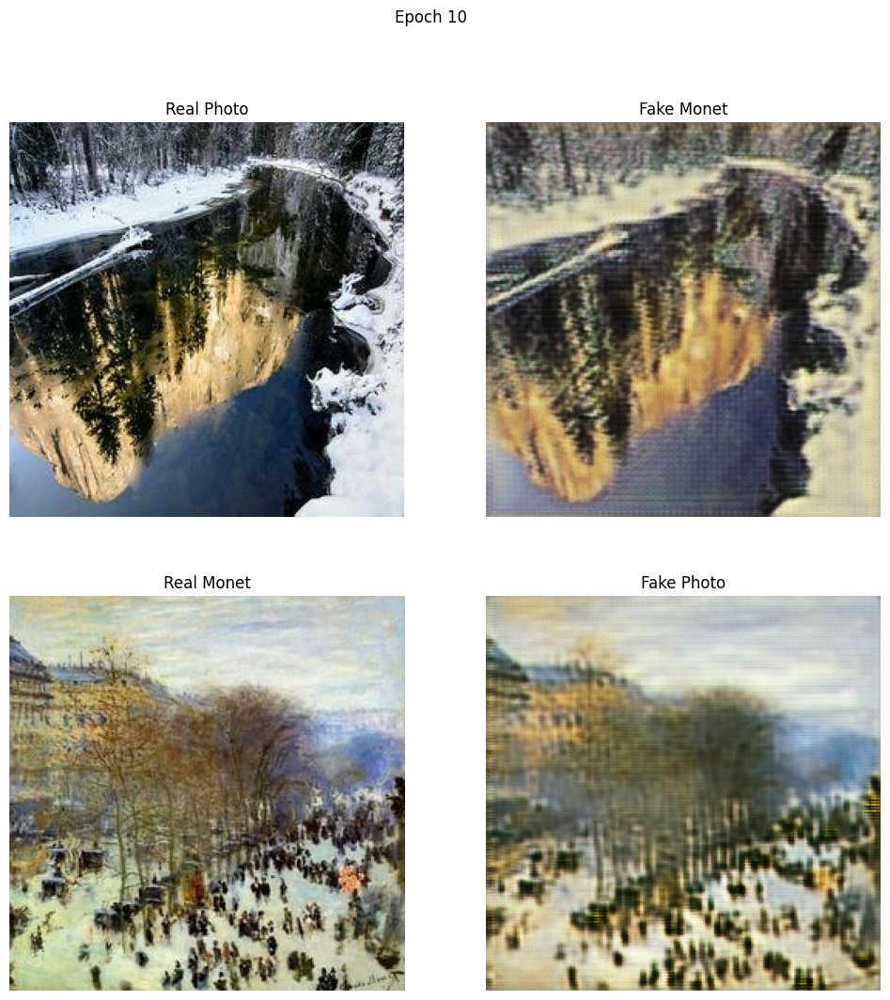

Epoch 11, Batch 100: Gen G Loss = 9.4814, Gen F Loss = 10.2739
Epoch 11, Batch 200: Gen G Loss = 6.8548, Gen F Loss = 7.2099
Epoch 11, Batch 300: Gen G Loss = 4.9885, Gen F Loss = 5.3161
Epoch 11 duration: 225.83 sec
Epoch 12, Batch 100: Gen G Loss = 6.9975, Gen F Loss = 6.0715
Epoch 12, Batch 200: Gen G Loss = 6.6952, Gen F Loss = 6.9273
Epoch 12, Batch 300: Gen G Loss = 5.0279, Gen F Loss = 4.5934
Epoch 12 duration: 225.82 sec
Epoch 13, Batch 100: Gen G Loss = 7.7542, Gen F Loss = 6.7063
Epoch 13, Batch 200: Gen G Loss = 6.1385, Gen F Loss = 5.8804
Epoch 13, Batch 300: Gen G Loss = 4.8587, Gen F Loss = 4.9061
Epoch 13 duration: 225.69 sec
Epoch 14, Batch 100: Gen G Loss = 5.8458, Gen F Loss = 5.4070
Epoch 14, Batch 200: Gen G Loss = 3.7622, Gen F Loss = 4.5451
Epoch 14, Batch 300: Gen G Loss = 5.5434, Gen F Loss = 5.7968
Epoch 14 duration: 226.15 sec
Epoch 15, Batch 100: Gen G Loss = 5.3870, Gen F Loss = 6.0871
Epoch 15, Batch 200: Gen G Loss = 5.1186, Gen F Loss = 5.8171
Epoch 15, B

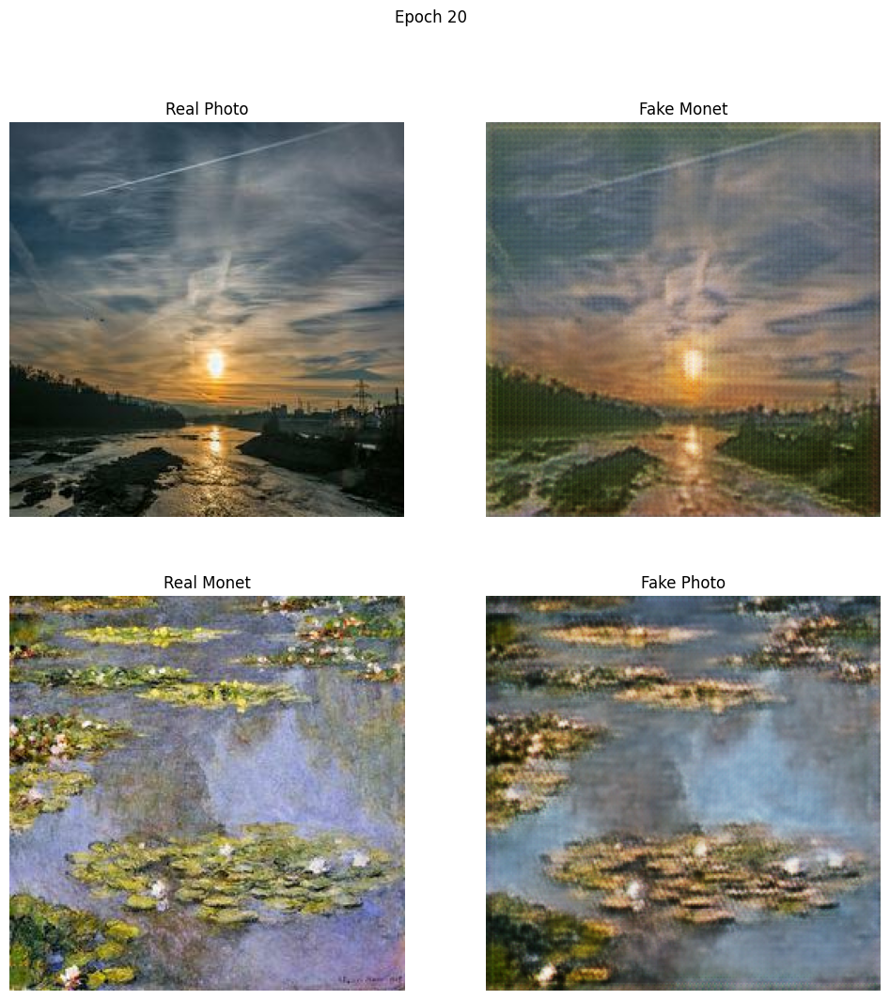

Epoch 21, Batch 100: Gen G Loss = 4.4504, Gen F Loss = 3.1364
Epoch 21, Batch 200: Gen G Loss = 3.7590, Gen F Loss = 3.5303
Epoch 21, Batch 300: Gen G Loss = 4.7267, Gen F Loss = 3.8931
Epoch 21 duration: 225.73 sec
Epoch 22, Batch 100: Gen G Loss = 4.6592, Gen F Loss = 4.2857
Epoch 22, Batch 200: Gen G Loss = 4.4685, Gen F Loss = 4.7564
Epoch 22, Batch 300: Gen G Loss = 4.0234, Gen F Loss = 3.6469
Epoch 22 duration: 225.72 sec
Epoch 23, Batch 100: Gen G Loss = 5.8590, Gen F Loss = 5.1330
Epoch 23, Batch 200: Gen G Loss = 4.8466, Gen F Loss = 4.6029
Epoch 23, Batch 300: Gen G Loss = 5.4713, Gen F Loss = 5.4779
Epoch 23 duration: 225.92 sec
Epoch 24, Batch 100: Gen G Loss = 4.8739, Gen F Loss = 4.6111
Epoch 24, Batch 200: Gen G Loss = 4.8365, Gen F Loss = 4.8145
Epoch 24, Batch 300: Gen G Loss = 4.5399, Gen F Loss = 4.6385
Epoch 24 duration: 225.24 sec
Epoch 25, Batch 100: Gen G Loss = 5.5679, Gen F Loss = 5.6957
Epoch 25, Batch 200: Gen G Loss = 4.3783, Gen F Loss = 3.4637
Epoch 25, Ba

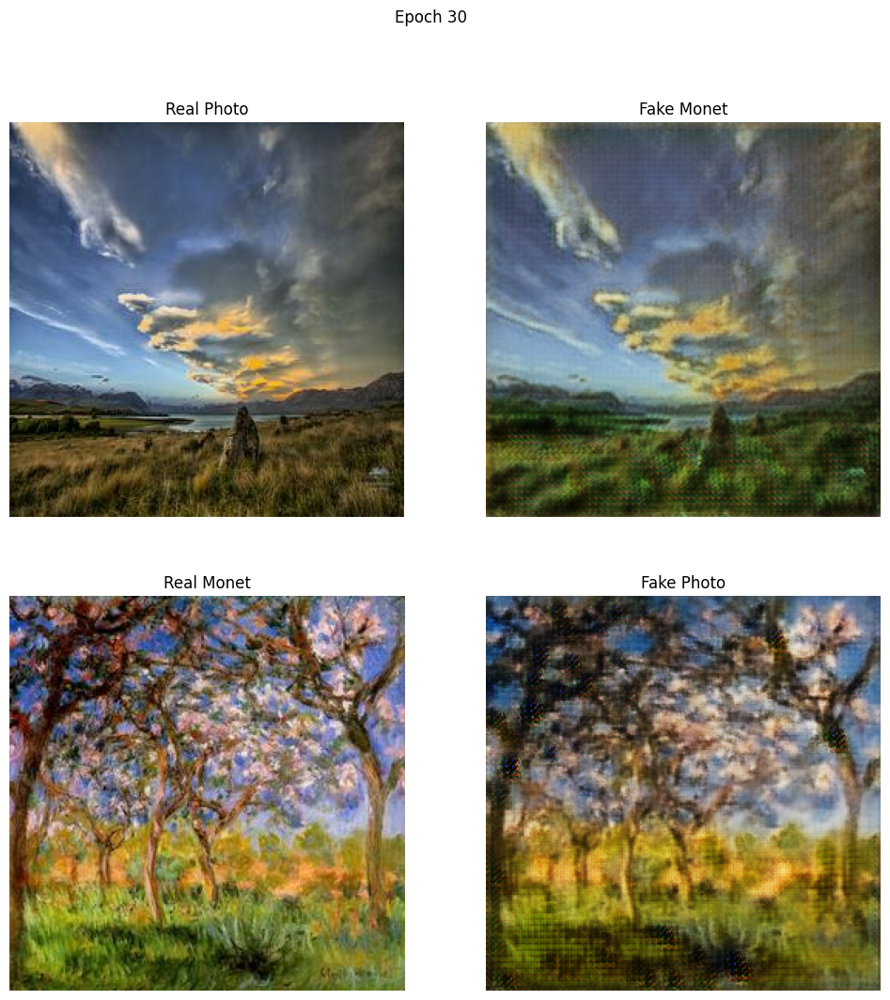

Epoch 31, Batch 100: Gen G Loss = 4.9874, Gen F Loss = 4.3299
Epoch 31, Batch 200: Gen G Loss = 5.5164, Gen F Loss = 5.5714
Epoch 31, Batch 300: Gen G Loss = 6.0236, Gen F Loss = 5.0320
Epoch 31 duration: 225.67 sec
Epoch 32, Batch 100: Gen G Loss = 4.7172, Gen F Loss = 4.1718
Epoch 32, Batch 200: Gen G Loss = 3.9206, Gen F Loss = 4.6216
Epoch 32, Batch 300: Gen G Loss = 3.8356, Gen F Loss = 3.8829
Epoch 32 duration: 225.95 sec
Epoch 33, Batch 100: Gen G Loss = 4.6262, Gen F Loss = 4.0717
Epoch 33, Batch 200: Gen G Loss = 4.5862, Gen F Loss = 3.3053
Epoch 33, Batch 300: Gen G Loss = 3.6369, Gen F Loss = 4.0094
Epoch 33 duration: 225.30 sec
Epoch 34, Batch 100: Gen G Loss = 3.8115, Gen F Loss = 3.6798
Epoch 34, Batch 200: Gen G Loss = 4.8070, Gen F Loss = 5.2387
Epoch 34, Batch 300: Gen G Loss = 3.7445, Gen F Loss = 3.8052
Epoch 34 duration: 225.46 sec
Epoch 35, Batch 100: Gen G Loss = 4.6150, Gen F Loss = 4.0277
Epoch 35, Batch 200: Gen G Loss = 3.7331, Gen F Loss = 3.4640
Epoch 35, Ba

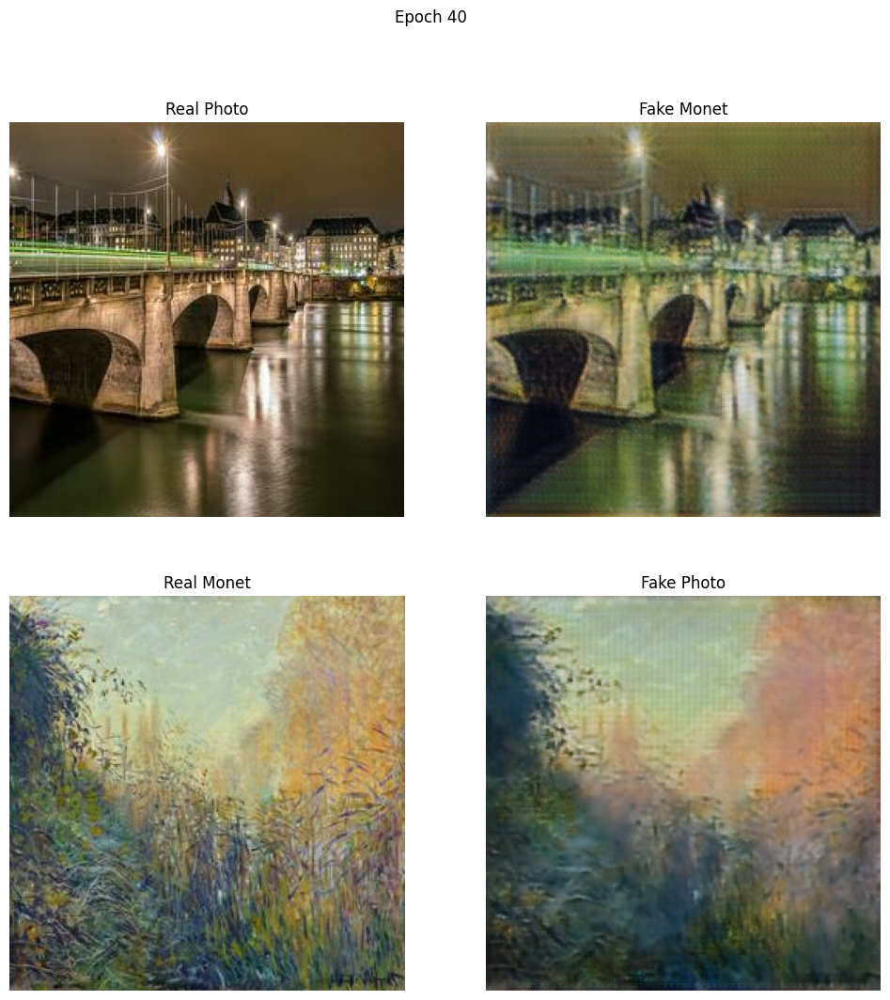

Epoch 41, Batch 100: Gen G Loss = 3.8698, Gen F Loss = 3.8516
Epoch 41, Batch 200: Gen G Loss = 3.8687, Gen F Loss = 3.9744
Epoch 41, Batch 300: Gen G Loss = 3.2981, Gen F Loss = 2.7157
Epoch 41 duration: 225.76 sec
Epoch 42, Batch 100: Gen G Loss = 4.9633, Gen F Loss = 4.3529
Epoch 42, Batch 200: Gen G Loss = 3.8852, Gen F Loss = 4.7249
Epoch 42, Batch 300: Gen G Loss = 3.7420, Gen F Loss = 3.9527
Epoch 42 duration: 226.08 sec
Epoch 43, Batch 100: Gen G Loss = 4.2214, Gen F Loss = 3.9330
Epoch 43, Batch 200: Gen G Loss = 3.2405, Gen F Loss = 3.1636
Epoch 43, Batch 300: Gen G Loss = 3.4246, Gen F Loss = 3.8952
Epoch 43 duration: 226.00 sec
Epoch 44, Batch 100: Gen G Loss = 4.5054, Gen F Loss = 4.9971
Epoch 44, Batch 200: Gen G Loss = 3.9276, Gen F Loss = 3.8126
Epoch 44, Batch 300: Gen G Loss = 4.5665, Gen F Loss = 3.6171
Epoch 44 duration: 225.85 sec
Epoch 45, Batch 100: Gen G Loss = 3.1521, Gen F Loss = 2.9797
Epoch 45, Batch 200: Gen G Loss = 4.9438, Gen F Loss = 3.8629
Epoch 45, Ba

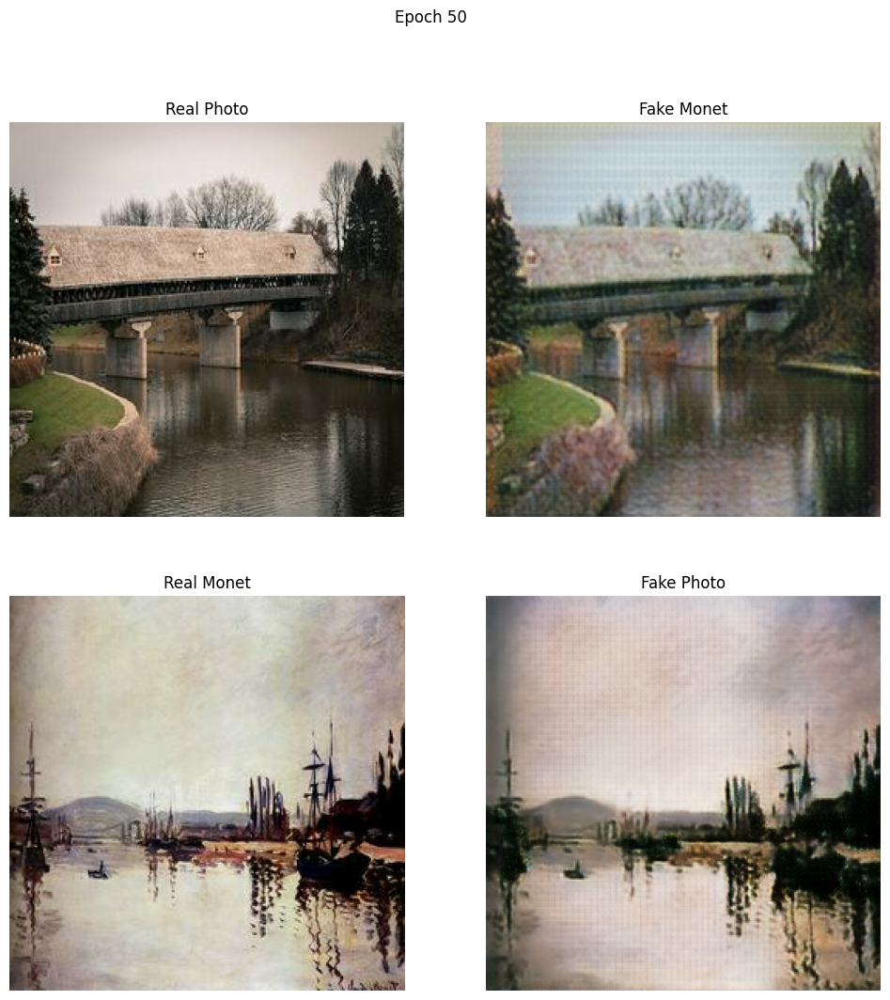

In [14]:
if __name__ == "__main__":
    photo_pattern = "../input/gan-getting-started/photo_jpg/*.jpg"   # Domain X: Photo path
    monet_pattern = "../input/gan-getting-started/monet_jpg/*.jpg" 
    
cyclegan = CycleGAN(photo_pattern, monet_pattern, epochs=50)
cyclegan.train()

# Result Analysis
## Gen G Loss Comparison (Batch 100, 200, and 300)
In the comparison of Gen G Loss, Batch 100 shows more significant fluctuations, especially in the early stages, with noticeable spikes in loss, such as in epochs 3, 4, and 11. As training progresses, the loss gradually stabilizes and reaches relatively lower values after epoch 44. In contrast, Batch 200 experiences less fluctuation, demonstrating a more stable training process, particularly in the later stages, where the loss is generally lower than that of Batch 100. Batch 300 shows the most variability, with significant increases and decreases in loss, especially at epochs 3, 15, and 20. This indicates that the learning process for Batch 300 may have more variance, possibly due to the generator’s complexity and the inherent randomness in the training process.

## Gen F Loss Comparison (Batch 100, 200, and 300)
The comparison of Gen F Loss shows that Batch 100 and Batch 200 have relatively stable loss values, especially Batch 200, which generally maintains a low and consistent loss, indicating a smoother training process. Batch 100 experiences some larger fluctuations in the early stages but gradually stabilizes in the later epochs. In contrast, Batch 300 shows more substantial fluctuations in Gen F Loss compared to the other two batches, with notable variations at epochs 1, 15, and 50. This suggests that the training process for Batch 300 may have more significant variance. Overall, Batch 300 seems to face greater instability or difficulty during its learning process, likely due to the generator’s complexity or the specific training settings employed.

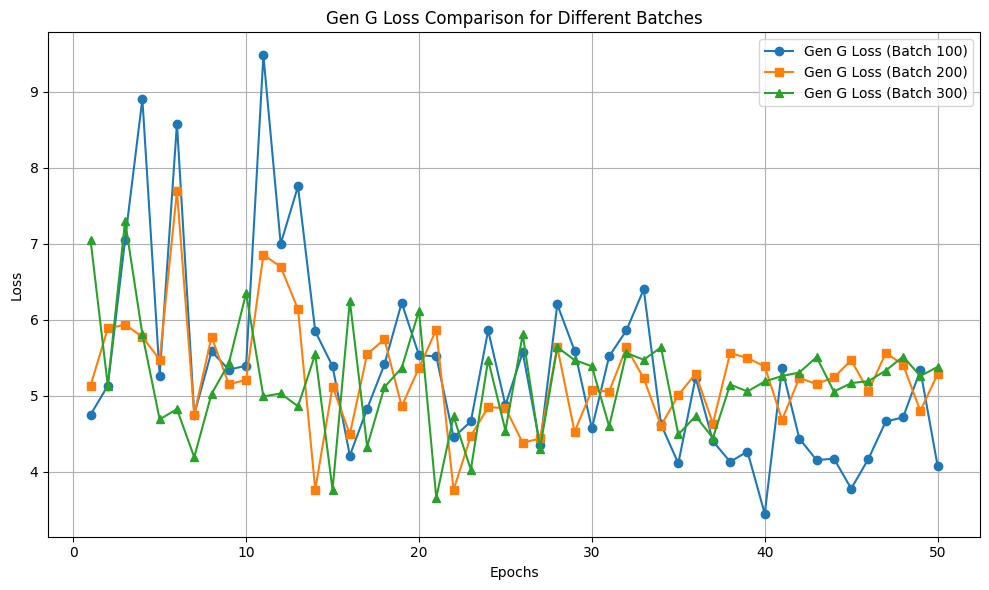

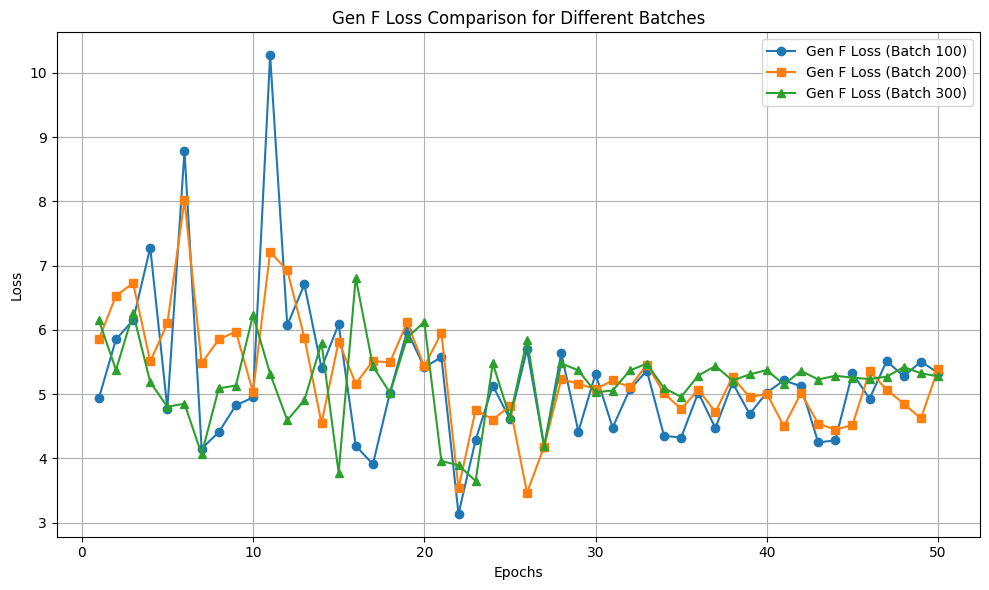

In [11]:
# Make sure the loss lists have the same length as the epochs list
gen_g_loss_batch_100 = gen_g_loss_batch_100[:50]
gen_f_loss_batch_100 = gen_f_loss_batch_100[:50]
gen_g_loss_batch_200 = gen_g_loss_batch_200[:50]
gen_f_loss_batch_200 = gen_f_loss_batch_200[:50]
gen_g_loss_batch_300 = gen_g_loss_batch_300[:50]
gen_f_loss_batch_300 = gen_f_loss_batch_300[:50]

# Create the first plot for Gen G Loss comparisons
plt.figure(figsize=(10, 6))
plt.plot(epochs, gen_g_loss_batch_100, label='Gen G Loss (Batch 100)', marker='o')
plt.plot(epochs, gen_g_loss_batch_200, label='Gen G Loss (Batch 200)', marker='s')
plt.plot(epochs, gen_g_loss_batch_300, label='Gen G Loss (Batch 300)', marker='^')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Gen G Loss Comparison for Different Batches')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Create the second plot for Gen F Loss comparisons
plt.figure(figsize=(10, 6))
plt.plot(epochs, gen_f_loss_batch_100, label='Gen F Loss (Batch 100)', marker='o')
plt.plot(epochs, gen_f_loss_batch_200, label='Gen F Loss (Batch 200)', marker='s')
plt.plot(epochs, gen_f_loss_batch_300, label='Gen F Loss (Batch 300)', marker='^')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Gen F Loss Comparison for Different Batches')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# Conclusion
Based on the training results of the CycleGAN model, although Batch 200 demonstrates the best stability and consistency in both Gen G Loss and Gen F Loss, Batch 100 and Batch 300 show greater variability during the training process, indicating some fluctuations and instability. This may be due to various factors, including a high learning rate, a complex model structure, or insufficient data diversity.

For Batch 100, the initial loss exhibits significant fluctuations, suggesting that the model may not have quickly adapted to the data distribution during the learning process. This could be due to a high learning rate, which may have led to overfitting or gradient explosion during training. These issues could prevent the model from stabilizing its learning in the early stages. In contrast, Batch 200 shows a more stable training curve, likely due to better-optimized hyperparameters, particularly the use of learning rate and regularization techniques, which enable the model to gradually converge.

However, the fluctuations in Batch 300 indicate that the model faced more challenges during the learning process. This could be attributed to the high complexity of the CycleGAN model, or the batch size and learning rate may not have been suitable for this training stage. These variabilities could be improved with more refined hyperparameter tuning, such as reducing the learning rate, using dynamic learning rate scheduling, or incorporating regularization techniques to prevent overfitting.

Overall, by performing more detailed hyperparameter adjustments, optimizing the model architecture, and refining the training strategy for different batches, the training process can be further stabilized, and the performance of all batches can be improved, particularly in optimizing Gen G Loss and Gen F Loss.

In [ ]:
import os
import zipfile
import numpy as np
from PIL import Image
import tensorflow as tf

def generate_and_zip_images(generator, output_zip="images.zip", num_images=10000, img_height=64, img_width=64):
    # Create a temporary directory to store images (optional, because it will be stored directly in the zip)
    temp_dir = "/kaggle/working/tmp_images"
    os.makedirs(temp_dir, exist_ok=True)
    
    # Open the zip file in write mode
    with zipfile.ZipFile(output_zip, 'w', zipfile.ZIP_DEFLATED) as zipf:
        
        for count in range(num_images):
            # Generate an image (replace with your generator logic)
            noise = tf.random.normal([1, 100])  # Example noise input for the GAN generator
            generated_image = generator(noise, training=False)
            img = generated_image[0].numpy()

            # Convert the image to the range [0, 255]
            img = (img + 1) * 127.5
            img = np.clip(img, 0, 255).astype(np.uint8)

            # Convert to PIL image format for saving
            pil_img = Image.fromarray(img)
            
            # Directly save the image as PNG into the zip
            img_filename = f"{count:05d}.png"
            with zipf.open(img_filename, 'w') as img_file:
                pil_img.save(img_file, format="PNG")



generate_and_zip_images(generator)
